<a href="https://colab.research.google.com/github/Alyxx-The-Sniper/CNN/blob/main/Food_Classification_Part4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Running Multiple Experiments


In this project, we will simultaneously conduct multiple experiments to compare the performance of three different versions of EfficientNets: EFFICIENTNET_B0, EFFICIENTNET_B2, and EFFICIENTNET_V2_S. Each experiment will consist of training the models for 5 and 10 epochs, respectively. To track the training progress, we will employ TensorBoard to visualize the metrics related to loss and accuracy.

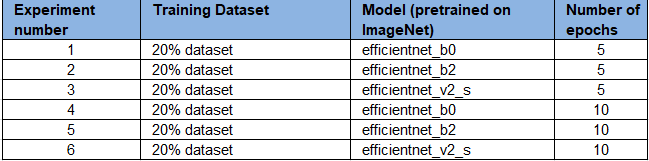

# Get_data / Set-up Data

Copy neccesary python scripts from google drive

In [1]:
import shutil
from shutil import copy
import torch

def copy_drive_script(source_file_path: str, destination_file_path: str):
  copy(source_file_path, destination_file_path)
  print("File copied successfully!")

source = ['/content/drive/MyDrive/Deep_learning/get_data.py',
          '/content/drive/MyDrive/Deep_learning/data_setup.py',
          '/content/drive/MyDrive/Deep_learning/model_builder.py',
          '/content/drive/MyDrive/Deep_learning/engine.py',
          '/content/drive/MyDrive/Deep_learning/utils.py',
          '/content/drive/MyDrive/Deep_learning/train.py',
          '/content/drive/MyDrive/Deep_learning/predict.py',
          "/content/drive/MyDrive/Deep_learning/helper_functions.py"]

destination = ['get_data.py', 
               'data_setup.py',
               'model_builder.py', 
               'engine.py', 
               'utils.py', 
               'train.py', 
               'predict.py', 
               "helper_functions.py"] 

for src, dest in zip(source, destination):
    copy(src, dest)
    print ('File copied successfully!')

File copied successfully!
File copied successfully!
File copied successfully!
File copied successfully!
File copied successfully!
File copied successfully!
File copied successfully!
File copied successfully!


In [2]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

# Import random seed from helper function
from helper_functions import set_seeds

cpu


Download 20% of data samples

In [3]:
# Get_data.py
!python get_data.py --food_list 'cup_cakes,donuts,french_fries,ice_cream' --copy_percentage 0.2

[INFO] Copying 0.2 percent of ['cup_cakes', 'donuts', 'french_fries', 'ice_cream']
100%|█████████████████████████████████████████| 150/150 [00:34<00:00,  4.40it/s]
Download Complete


# Create Path Directories

In [4]:
from pathlib import Path

# Setup Dirs
train_dir = Path('data/my_fav_foods/train')
test_dir = Path('data/my_fav_foods/test')

# Transforms
To keep things consistent, we'll manually create a transform and use the same transform across all of the datasets.

The transform will:

1. Resize all the images (we'll start with 224, but this could be changed i.e EfficientNet resize is 288, See documentation for reference).
2. Turn them into tensors with values between 0 & 1.
3. Normalize them in way so their distributions are inline with the ImageNet dataset (we do this because our models from torchvision.models have been pretrained on ImageNet).

In [5]:
from torchvision import transforms

# Manual transform
# Create a transform to normalize data distribution to be inline with ImageNet
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], # values per colour channel [red, green, blue]
                                 std=[0.229, 0.224, 0.225]) # values per colour channel [red, green, blue]

# Compose transforms into a pipeline
simple_transform = transforms.Compose([
    transforms.Resize((224, 224)), # 1. 224 is the most common size, upscaling requires more computational resources
    transforms.ToTensor(), # 2. Turn the images into tensors with values between 0 & 1
    normalize # 3. Normalize the images so their distributions match the ImageNet dataset 
])


# # Auto transfrom
# weights_B0 = torchvision.models.EfficientNet_B0_Weights.DEFAULT 
# weights_B2 = torchvision.models.EfficientNet_B2_Weights.DEFAULT 
# weights_V2_S = torchvision.models.EfficientNet_V2_S_Weights.DEFAULT 

# auto_transforms_B0 = weights_B0.transforms()
# auto_transforms_B2 = weights_B2.transforms()
# auto_transforms_V2_S = weights_V2_S.transforms()

#Dataloaders

In [6]:
# Create training and testing DataLoaders as well as get a list of class names
import data_setup

BATCH_SIZE = 32

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                                               test_dir=test_dir, 
                                                                               transform=simple_transform,
                                                                               batch_size=BATCH_SIZE)

# Create Model and Freeze EfficientNets features

>Note: Whenever you use a different model, one of the first things you should inspect is the input and output shapes. That way you'll know how you'll have to prepare your input data/update the model to have the correct output shape.

>Note: Many modern models can handle input images of varying sizes thanks to torch.nn.AdaptiveAvgPool2d() layer, this layer adaptively adjusts the output_size of a given input as required. You can try this out by passing different size input images to torchinfo.summary() or to your own models using the layer.

In [7]:
import torchvision
from torch import nn

# Get num out features (one for each class pizza, steak, sushi)
OUT_FEATURES = len(class_names)

Functions to create models

In [8]:
# Create an EffNetB0 feature extractor
def create_effnetb0():
    # 1. Get the base mdoel with pretrained weights and send to target device
    weights_b0 = torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model = torchvision.models.efficientnet_b0(weights=weights_b0).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb0"
    print(f"[INFO] Created new {model.name} model.")
    return model

#############################################################################
# Create an EffNetB2 feature extractor
def create_effnetb2():
    # 1. Get the base model with pretrained weights and send to target device
    weights_B2 = torchvision.models.EfficientNet_B2_Weights.DEFAULT
    model = torchvision.models.efficientnet_b2(weights=weights_B2).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features=1408, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb2"
    print(f"[INFO] Created new {model.name} model.")
    return model

#############################################################################
# Create an EffNetV2S feature extractor
def create_effnetv2s():
    # 1. Get the base model with pretrained weights and send to target device
    weights_V2_S = torchvision.models.EfficientNet_V2_S_Weights.DEFAULT
    model = torchvision.models.efficientnet_v2_s(weights=weights_V2_S).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetv2s"
    print(f"[INFO] Created new {model.name} model.")
    return model    

#Writer
Create a helper function to build SummaryWriter() instances

In [9]:
from torch.utils.tensorboard import SummaryWriter

# Create a writer with all default settings
writer = SummaryWriter()

In [10]:
def create_writer(experiment_name: str, 
                  model_name: str, 
                  extra: str=None) -> torch.utils.tensorboard.writer.SummaryWriter():
    """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.
    log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.
    Where timestamp is the current date in YYYY-MM-DD format.

    Args:
        experiment_name (str): Name of experiment.
        model_name (str): Name of model.
        extra (str, optional): Anything extra to add to the directory. Defaults to None.

    Returns:
        torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

    Example usage:
        # Create a writer saving to "runs/2022-06-04/data_10_percent/effnetb2/5_epochs/"
        writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb2",
                               extra="5_epochs")
        # The above is the same as:
        writer = SummaryWriter(log_dir="runs/2022-06-04/data_10_percent/effnetb2/5_epochs/")
    """
    from datetime import datetime
    import os

    # Get timestamp of current date (all experiments on certain day live in same folder)
    timestamp = datetime.now().strftime("%Y-%m-%d") # returns current date in YYYY-MM-DD format

    if extra:
        # Create log directory path
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
    else:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name)
        
    print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
    return SummaryWriter(log_dir=log_dir)

#Modify Train Script

- Import train_step and test_step from engine.py
- Modify out train code to add writer for tracking loss and accuracy

In [11]:
from typing import Dict, List
from tqdm.auto import tqdm
from engine import train_step, test_step

# Add writer parameter to train()
def train_V2(model: torch.nn.Module, 
          train_dataloader: torch.utils.data.DataLoader, 
          test_dataloader: torch.utils.data.DataLoader, 
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device, 
          writer: torch.utils.tensorboard.writer.SummaryWriter # new parameter to take in a writer
          ) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.
    Calculates, prints and stores evaluation metrics throughout.
    Stores metrics to specified writer log_dir if present.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on both datasets.
      epochs: An integer indicating how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").
      writer: A SummaryWriter() instance to log model results to.

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each metric has a value in a list for 
      each epoch.
      In the form: {train_loss: [...],
                train_acc: [...],
                test_loss: [...],
                test_acc: [...]} 
      For example if training for epochs=2: 
              {train_loss: [2.0616, 1.0537],
                train_acc: [0.3945, 0.3945],
                test_loss: [1.2641, 1.5706],
                test_acc: [0.3400, 0.2973]} 
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        ### New: Use the writer parameter to track experiments ###
        # See if there's a writer, if so, log to it
        if writer:
            # Add results to SummaryWriter
            writer.add_scalars(main_tag="Loss", 
                               tag_scalar_dict={"train_loss": train_loss,
                                                "test_loss": test_loss},
                               global_step=epoch)
            writer.add_scalars(main_tag="Accuracy", 
                               tag_scalar_dict={"train_acc": train_acc,
                                                "test_acc": test_acc}, 
                               global_step=epoch)

            # Close the writer
            writer.close()
        else:
            pass
    ### End new ###

    # Return the filled results at the end of the epochs
    return results

#Set-up epoch, models, and train_dataloaders

In [12]:
# 1. Create epochs list
num_epochs = [5, 10]

# 2. Create models list (need to create a new model for each experiment)
models = ["effnetb0", "effnetb2", 'effnetv2s']

# 3. Create dataloaders dictionary for various dataloaders
train_dataloaders = {"train_data_20_percent": train_dataloader}

#Start Training

In [13]:
%%time
from utils import save_model

# 1. Set the random seeds
set_seeds(seed=42)

# 2. Keep track of experiment numbers
experiment_number = 0

# 3. Loop through each DataLoader
for dataloader_name, train_dataloader in train_dataloaders.items():

    # 4. Loop through each number of epochs
    for epochs in num_epochs: 

        # 5. Loop through each model name and create a new model based on the name
        for model_name in models:

            # 6. Create information print outs
            experiment_number += 1
            print(f"[INFO] Experiment number: {experiment_number}")
            print(f"[INFO] Model: {model_name}")
            print(f"[INFO] DataLoader: {dataloader_name}")
            print(f"[INFO] Number of epochs: {epochs}")  

            # 7. Select the model
            if model_name == "effnetb0":
                model = create_effnetb0() # creates a new model each time (important because we want each experiment to start from scratch)
            elif model_name == "effnetb2":
                model = create_effnetb2() # creates a new model each time (important because we want each experiment to start from scratch)
            else:
                model = create_effnetv2s()  # creates a new model each time (important because we want each experiment to start from scratch)

            
            # 8. Create a new loss and optimizer for every model
            loss_fn = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

            # 9. Train target model with target dataloaders and track experiments
            train_V2(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_dataloader, 
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=epochs,
                  device=device,
                  writer=create_writer(experiment_name=dataloader_name,
                                       model_name=model_name,
                                       extra=f"{epochs}_epochs"))
            
            # 10. Save the model to file so we can get back the best model
            save_filepath = f"{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            save_model(model=model,
                       target_dir="models",
                       model_name=save_filepath)
            print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: train_data_20_percent
[INFO] Number of epochs: 5


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 81.9MB/s]


[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2023-06-12/train_data_20_percent/effnetb0/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2050 | train_acc: 0.5203 | test_loss: 0.8459 | test_acc: 0.8616
Epoch: 2 | train_loss: 0.8449 | train_acc: 0.7988 | test_loss: 0.6456 | test_acc: 0.8884
Epoch: 3 | train_loss: 0.6907 | train_acc: 0.8180 | test_loss: 0.5262 | test_acc: 0.9107
Epoch: 4 | train_loss: 0.5594 | train_acc: 0.8854 | test_loss: 0.4579 | test_acc: 0.9018
Epoch: 5 | train_loss: 0.5274 | train_acc: 0.8695 | test_loss: 0.4011 | test_acc: 0.9152
[INFO] Saving model to: models/effnetb0_train_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: train_data_20_percent
[INFO] Number of epochs: 5


Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-bcdf34b7.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-bcdf34b7.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 176MB/s]

[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2023-06-12/train_data_20_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2596 | train_acc: 0.4326 | test_loss: 0.9692 | test_acc: 0.8170
Epoch: 2 | train_loss: 0.9151 | train_acc: 0.7626 | test_loss: 0.7395 | test_acc: 0.8750
Epoch: 3 | train_loss: 0.7546 | train_acc: 0.8015 | test_loss: 0.6074 | test_acc: 0.8973
Epoch: 4 | train_loss: 0.6311 | train_acc: 0.8328 | test_loss: 0.5344 | test_acc: 0.8929
Epoch: 5 | train_loss: 0.5720 | train_acc: 0.8427 | test_loss: 0.4972 | test_acc: 0.8973
[INFO] Saving model to: models/effnetb2_train_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetv2s
[INFO] DataLoader: train_data_20_percent
[INFO] Number of epochs: 5


Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth
100%|██████████| 82.7M/82.7M [00:00<00:00, 210MB/s]


[INFO] Created new effnetv2s model.
[INFO] Created SummaryWriter, saving to: runs/2023-06-12/train_data_20_percent/effnetv2s/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2407 | train_acc: 0.4885 | test_loss: 0.9087 | test_acc: 0.8393
Epoch: 2 | train_loss: 0.8741 | train_acc: 0.7643 | test_loss: 0.6730 | test_acc: 0.8661
Epoch: 3 | train_loss: 0.6791 | train_acc: 0.8311 | test_loss: 0.5504 | test_acc: 0.8795
Epoch: 4 | train_loss: 0.6217 | train_acc: 0.8306 | test_loss: 0.4698 | test_acc: 0.8839
Epoch: 5 | train_loss: 0.5641 | train_acc: 0.8311 | test_loss: 0.4390 | test_acc: 0.8705
[INFO] Saving model to: models/effnetv2s_train_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 4
[INFO] Model: effnetb0
[INFO] DataLoader: train_data_20_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2023-06-12/train_data_20_percent/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2050 | train_acc: 0.5203 | test_loss: 0.8459 | test_acc: 0.8616
Epoch: 2 | train_loss: 0.8449 | train_acc: 0.7988 | test_loss: 0.6456 | test_acc: 0.8884
Epoch: 3 | train_loss: 0.6907 | train_acc: 0.8180 | test_loss: 0.5262 | test_acc: 0.9107
Epoch: 4 | train_loss: 0.5594 | train_acc: 0.8854 | test_loss: 0.4579 | test_acc: 0.9018
Epoch: 5 | train_loss: 0.5274 | train_acc: 0.8695 | test_loss: 0.4011 | test_acc: 0.9152
Epoch: 6 | train_loss: 0.4618 | train_acc: 0.8849 | test_loss: 0.3769 | test_acc: 0.9196
Epoch: 7 | train_loss: 0.4319 | train_acc: 0.8827 | test_loss: 0.3547 | test_acc: 0.9152
Epoch: 8 | train_loss: 0.3788 | train_acc: 0.9145 | test_loss: 0.3496 | test_acc: 0.8929
Epoch: 9 | train_loss: 0.3909 | train_acc: 0.8909 | test_loss: 0.3378 | test_acc: 0.8839
Epoch: 10 | train_loss: 0.3642 | train_acc: 0.8876 | test_loss: 0.3213 | test_acc: 0.9196
[INFO] Saving model to: models/effnetb0_train_data_20_percent_10_epochs.pth
---------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2596 | train_acc: 0.4326 | test_loss: 0.9692 | test_acc: 0.8170
Epoch: 2 | train_loss: 0.9151 | train_acc: 0.7626 | test_loss: 0.7395 | test_acc: 0.8750
Epoch: 3 | train_loss: 0.7546 | train_acc: 0.8015 | test_loss: 0.6074 | test_acc: 0.8973
Epoch: 4 | train_loss: 0.6311 | train_acc: 0.8328 | test_loss: 0.5344 | test_acc: 0.8929
Epoch: 5 | train_loss: 0.5720 | train_acc: 0.8427 | test_loss: 0.4972 | test_acc: 0.8973
Epoch: 6 | train_loss: 0.5212 | train_acc: 0.8487 | test_loss: 0.4705 | test_acc: 0.8839
Epoch: 7 | train_loss: 0.4835 | train_acc: 0.8723 | test_loss: 0.4496 | test_acc: 0.8795
Epoch: 8 | train_loss: 0.4452 | train_acc: 0.8909 | test_loss: 0.4224 | test_acc: 0.8839
Epoch: 9 | train_loss: 0.4117 | train_acc: 0.8914 | test_loss: 0.4035 | test_acc: 0.8839
Epoch: 10 | train_loss: 0.3997 | train_acc: 0.8975 | test_loss: 0.3952 | test_acc: 0.8884
[INFO] Saving model to: models/effnetb2_train_data_20_percent_10_epochs.pth
---------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2407 | train_acc: 0.4885 | test_loss: 0.9087 | test_acc: 0.8393
Epoch: 2 | train_loss: 0.8741 | train_acc: 0.7643 | test_loss: 0.6730 | test_acc: 0.8661
Epoch: 3 | train_loss: 0.6791 | train_acc: 0.8311 | test_loss: 0.5504 | test_acc: 0.8795
Epoch: 4 | train_loss: 0.6217 | train_acc: 0.8306 | test_loss: 0.4698 | test_acc: 0.8839
Epoch: 5 | train_loss: 0.5641 | train_acc: 0.8311 | test_loss: 0.4390 | test_acc: 0.8705
Epoch: 6 | train_loss: 0.5134 | train_acc: 0.8591 | test_loss: 0.4128 | test_acc: 0.8750
Epoch: 7 | train_loss: 0.4923 | train_acc: 0.8394 | test_loss: 0.3908 | test_acc: 0.8839
Epoch: 8 | train_loss: 0.4557 | train_acc: 0.8766 | test_loss: 0.3785 | test_acc: 0.8705
Epoch: 9 | train_loss: 0.4349 | train_acc: 0.8690 | test_loss: 0.3772 | test_acc: 0.8750
Epoch: 10 | train_loss: 0.4071 | train_acc: 0.8799 | test_loss: 0.3587 | test_acc: 0.8616
[INFO] Saving model to: models/effnetv2s_train_data_20_percent_10_epochs.pth
--------------------------------

# TensorBoard

In [18]:
# Viewing TensorBoard in Jupyter and Google Colab Notebooks (uncomment to view full TensorBoard instance)
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Load The Best Model 

In [19]:
# # Setup the best model filepath
best_model_path = '/content/models/effnetb0_train_data_20_percent_10_epochs.pth'

# Instantiate a new instance of EffNetB0 (to load the saved state_dict() to)
best_model = create_effnetb0()

# Load the saved best model state_dict()
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb0 model.


<All keys matched successfully>

Check file size

In [20]:
# Check the model file size
from pathlib import Path

# Get the model size in bytes then convert to megabytes
effnetb0_model_size = Path(best_model_path).stat().st_size // (1024*1024)
print(f"EfficientNetB0 feature extractor model size: {effnetb0_model_size} MB")

EfficientNetB0 feature extractor model size: 15 MB


Confusion Matrix

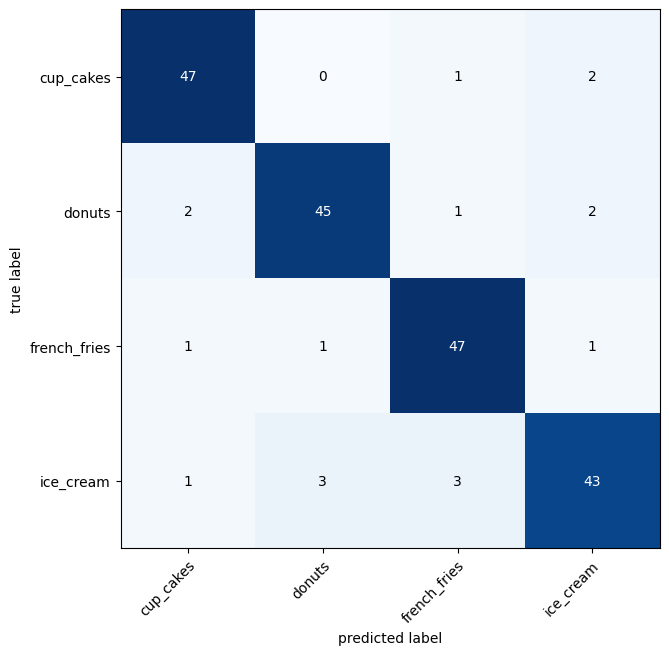

In [22]:
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=UserWarning, module="torch.utils.data.dataloader")

def make_preds_testdata(model: torch.nn.Module):

  # Make predictions on the entire test dataset
  test_preds = []
  model.eval()
  with torch.inference_mode():
    # Loop through the batches in the test dataloader
    for X, y in test_dataloader:
      X, y = X.to(device), y.to(device)
      # Pass the data through the model
      test_logits = model(X)

      # Convert the pred logits to pred probs
      pred_probs = torch.softmax(test_logits, dim=1)

      # Convert the pred probs into pred labels
      pred_labels = torch.argmax(pred_probs, dim=1)

      # Add the pred labels to test preds list
      test_preds.append(pred_labels)

  # Concatenate the test preds and put them on the CPU
  test_preds = torch.cat(test_preds).cpu()
  return test_preds


# Get the truth labels for test dataset
test_truth = torch.cat([y for X, y in test_dataloader])

!pip install -q torchmetrics -U mlxtend
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix


# Setup confusion matrix instance
confmat = ConfusionMatrix(task='multiclass', num_classes=len(class_names))
confmat_tensor = confmat(preds= make_preds_testdata(best_model),
                         target=test_truth)

# Plot the confusion matrix
fig, ax = plot_confusion_matrix(
    conf_mat=confmat_tensor.numpy(), # matplotlib likes working with NumPy
    class_names=class_names,
    figsize=(10, 7))  

# Predict Custom Image

--2023-06-12 10:30:14--  https://images.unsplash.com/photo-1602101449157-e1d06a4b3383?ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8Mnx8aWNlJTIwY3JlYW0lMjBnaXJsfGVufDB8fDB8fHww&auto=format&fit=crop&w=500&q=60
Resolving images.unsplash.com (images.unsplash.com)... 146.75.78.208, 2a04:4e42:84::720
Connecting to images.unsplash.com (images.unsplash.com)|146.75.78.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 60518 (59K) [image/jpeg]
Saving to: ‘icecream101.jpg’

icecream101.jpg     100%[===================>]  59.10K  --.-KB/s    in 0.01s   

2023-06-12 10:30:14 (4.74 MB/s) - ‘icecream101.jpg’ saved [60518/60518]



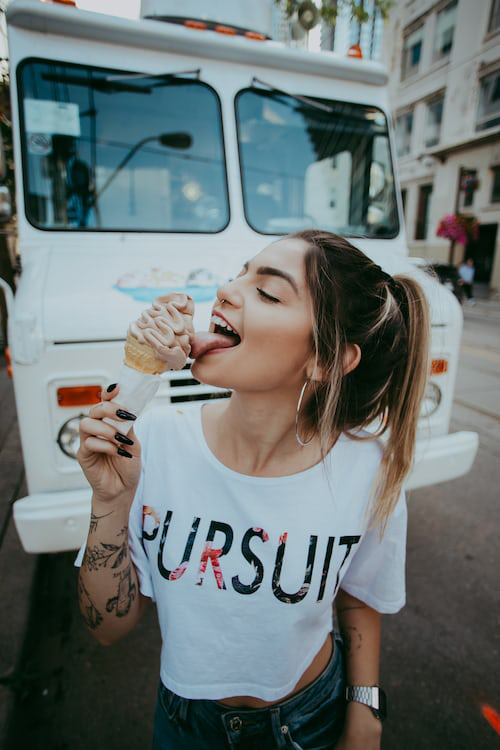

In [23]:
# get an Image fron the net
!wget -O icecream101.jpg "https://images.unsplash.com/photo-1602101449157-e1d06a4b3383?ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8Mnx8aWNlJTIwY3JlYW0lMjBnaXJsfGVufDB8fDB8fHww&auto=format&fit=crop&w=500&q=60"
      # open the image
from PIL import Image
img =  Image.open("icecream101.jpg") 
img

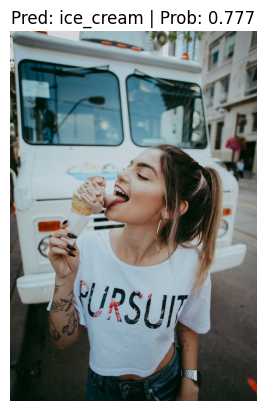

In [24]:
from helper_functions import pred_and_plot_image

pred_and_plot_image(model=best_model,
                   image_path='/content/icecream101.jpg',
                   class_names=class_names,
                   transform = simple_transform,
                   image_size=(224, 224))

# Predict random image from testdata

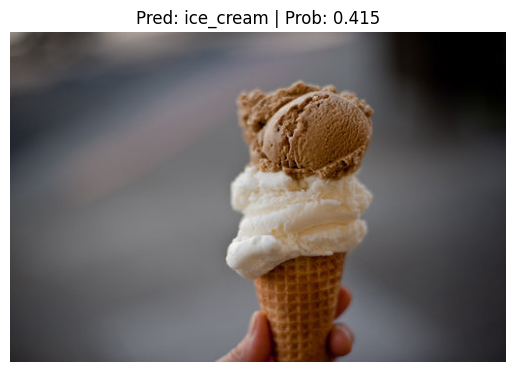

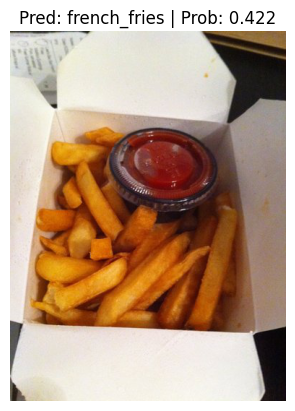

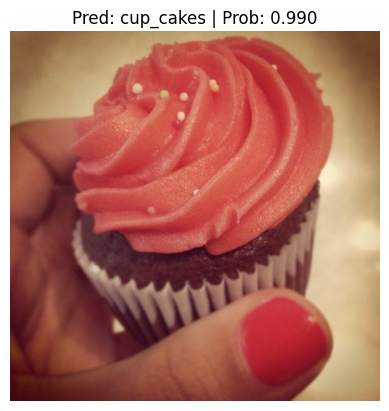

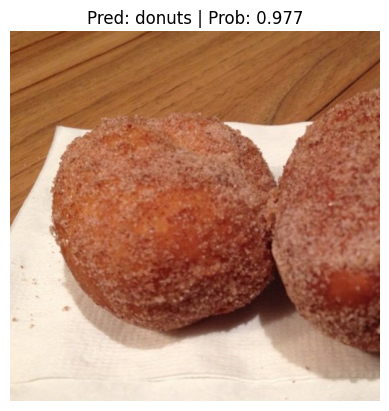

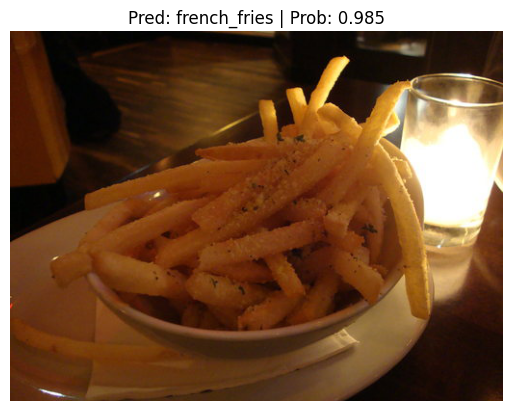

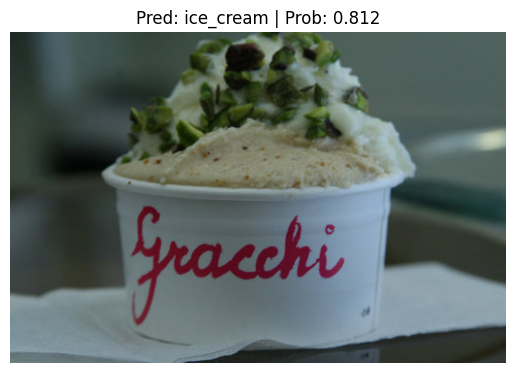

In [26]:
# Get a random list of 3 images from 20% test set
import random
num_images_to_plot = 6
test_image_path_list = list(Path('/content/data/my_fav_foods/test').glob("*/*.jpg")) # get all test image paths from 20% dataset
test_image_path_sample = random.sample(population=test_image_path_list,
                                       k=num_images_to_plot) # randomly select k number of images

# Iterate through random test image paths, make predictions on them and plot them
for image_path in test_image_path_sample:
    pred_and_plot_image(model=best_model,
                        image_path=image_path,
                        class_names=class_names,
                        transform = simple_transform,
                        image_size=(224, 224))